In [1]:
import pandas as pd
df = pd.read_csv('Reviews2.csv')
import numpy as np

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.express as px
# Product Scores
fig = px.histogram(df, x="Score")
fig.update_traces(marker_color="turquoise",marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5)
fig.update_layout(title_text='Product Score')
fig.show()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Humberto\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


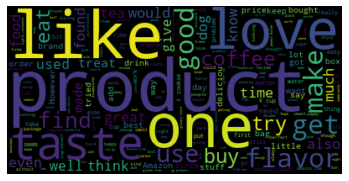

In [3]:
import nltk
from nltk.corpus import stopwords
nltk.download("stopwords")
chachedWords = stopwords.words('english')
from wordcloud import WordCloud 

# Create stopword list:
stopwords = set(stopwords.words('english'))
stopwords.update(["br", "href"])
textt = " ".join(review for review in df.Text)
wordcloud = WordCloud(stopwords=stopwords).generate(textt)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.savefig('wordcloud11.png')
plt.show()

In [4]:
df['sentiment'] = df['Score'].apply(lambda rating : +1 if rating > 3 else -1)

In [5]:
df

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,sentiment
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,1
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,-1
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,1
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,-1
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,1
...,...,...,...,...,...,...,...,...,...,...,...
249200,249201,B004TPKAN4,APMYPD97EHUUZ,"John H. Gruver ""brainactiv""",0,0,4,1320451200,Great store-bought cookies.,Wow! Ginger mas grande! These are great! Crisp...,1
249201,249202,B004TPKAN4,A1SVXJZ3386U2D,Randy Keehn,0,0,2,1320451200,The Sage of Food Needs a New Recipe,Love the salad dressing and the Spagetti sauce...,-1
249202,249203,B004TPKAN4,A1SINHLUYMCCRK,"David Ross ""Cook, Chemist, Nurse""",0,0,3,1320451200,Nicely Spiced but too hot for some,I enjoyed these ginger snaps since they were c...,-1
249203,249204,B004TPKAN4,ADBKEDZKYHU3A,NC Reader,11,12,5,1319500800,"Crunchy, spicy, not too sweet - YUM!","I can't believe how good these are, especially...",1


In [6]:
positive = df[df['sentiment'] == 1]
negative = df[df['sentiment'] == -1]

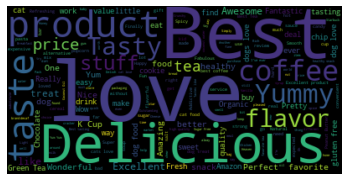

In [7]:
stopwords = set(stopwords)
stopwords.update(["br", "href","good","great"])
pos = " ".join(review for review in positive.Summary)
wordcloud2 = WordCloud(stopwords=stopwords).generate(pos)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

In [8]:
negative['Summary'] = negative['Summary'].apply(str)

<ipython-input-8-d41b350b8f8f>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



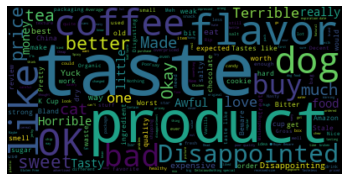

In [9]:
neg = " ".join(review for review in negative.Summary)
wordcloud3 = WordCloud(stopwords=stopwords).generate(neg)

plt.imshow(wordcloud3, interpolation='bilinear')
plt.axis("off")
plt.savefig('wordcloud33.png')
plt.show()

In [10]:
df['sentimentt'] = df['sentiment'].replace({-1 : 'negative'})
df['sentimentt'] = df['sentimentt'].replace({1 : 'positive'})
fig = px.histogram(df, x="sentimentt")
fig.update_traces(marker_color="indianred",marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5)
fig.update_layout(title_text='Product Sentiment')
fig.show()

In [11]:
def remove_punctuation(text):
    final = "".join(u for u in text if u not in ("?", ".", ";", ":", "!",'"'))
    return final
df['Text'] = df['Text'].apply(remove_punctuation)
df = df.dropna(subset=['Summary'])
df['Summary'] = df['Summary'].apply(remove_punctuation)

<ipython-input-11-903d5d021ed6>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [12]:
dfNew = df[['Summary','sentiment']]
dfNew

,Summary,sentiment
0,Good Quality Dog Food,1
1,Not as Advertised,-1
2,Delight says it all,1
3,Cough Medicine,-1
4,Great taffy,1
...,...,...
249200,Great store-bought cookies,1
249201,The Sage of Food Needs a New Recipe,-1
249202,Nicely Spiced but too hot for some,-1
249203,"Crunchy, spicy, not too sweet - YUM",1


In [18]:
index = df.index
df['random_number'] = np.random.randn(len(index))
# use the train and test split function
train = df[df['random_number'] <= 0.8]
test = df[df['random_number'] > 0.8]

<ipython-input-18-6e0b3ec0570b>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [23]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(token_pattern=r'\b\w+\b')
train_matrix = vectorizer.fit_transform(train['Summary'].values.astype('U'))
test_matrix = vectorizer.transform(test['Summary'].values.astype('U'))
# use tfidf vectorizer

In [24]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()

In [25]:
X_train = train_matrix
X_test = test_matrix

In [26]:
train_matrix

<196500x22527 sparse matrix of type '<class 'numpy.int64'>'
	with 809219 stored elements in Compressed Sparse Row format>

In [27]:
y_train = train['sentiment']

In [28]:
y_test = test['sentiment']

In [29]:
lr.fit(X_train,y_train)

C:\Users\Humberto\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [30]:
predictions = lr.predict(X_test)

In [31]:
from sklearn.metrics import confusion_matrix,classification_report
new = np.asarray(y_test)
confusion_matrix(predictions,y_test)

array([[ 7510,  1759],
       [ 4244, 39182]], dtype=int64)

In [32]:
print(classification_report(predictions,y_test))

              precision    recall  f1-score   support

          -1       0.64      0.81      0.71      9269
           1       0.96      0.90      0.93     43426

    accuracy                           0.89     52695
   macro avg       0.80      0.86      0.82     52695
weighted avg       0.90      0.89      0.89     52695

